# Neural Style Transfer in TensorFlow

***By: Alex Mason***

Hello and welcome to this jupyter notebook. This project will focus on creating a project using a process known as neural style transfer. Neural style transfer uses a convolutional neural network and uses 2 different images and is able to blend them together by seperating and recombining the images to create an artistic style to one of the images. This was first developed by Gatys et al. (2015) and the paper can be found here: (https://arxiv.org/abs/1508.06576) 

I found that it was a rather easy paper to read and comprehend and I would recommend it. It is a very interesting topic and a personal favorite of mine. 

In short, neural style transfer takes an input image or **content image** and a **style reference image** and blends them together so that the input image is transformed using the style referenced image. Here is a sample of what neural style transfer looks like: 

![Picture](https://drive.google.com/uc?export=view&id=1lBtJMzWeKz_oImMsed7gYDW6GNfIvtx9)

Pretty cool right? That is what we will be implementing today inside of this notebook.

The structure of this project will be as follows: 

1. Import Packages
2. Data Visualization
3. Using the VGG19 architecture
4. Building The Model 
5. Content and Style Extraction
6. Gradient Descent 
7. Total Variation Loss Function 
8. Final Optimization Step
9. Bonus Section

Let's start by importing some packages we will need for this project.

### Import Packages

In [ ]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt 
import matplotlib as mpl
import numpy as np
import time 
import functools #higher order functions 
from IPython.display import Image, display
import PIL.Image

In [ ]:
#Configure GPU Usage
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the fourth GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


Now that we have our necessary libraries, let us look at our input image (AKA: content image) and our style reference image: 

### Data Visualization

I grabbed a random photo off of the internet of one of my favorite breeds of cats (ragdoll) that we will use as our content image:

In [ ]:
input_image = tf.keras.utils.get_file('ragdoll.jpg', 'https://www.catsbest.de/wp-content/uploads/katze-mit-blauen-augen-450x450.jpg')

## Picture of Cat

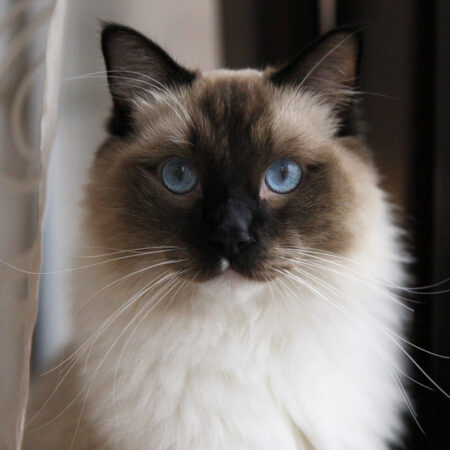

In [ ]:
display(Image(input_image))

For our style reference image, we want something with a lot of popping color, so we will use ***Mendrisiotto with Church of Obino by Hermann Sherer***

In [ ]:
style_reference_image = tf.keras.utils.get_file('Mendrisiotto-with-Church-of-Obino-Hermann-Scherer.jpeg','https://upload.wikimedia.org/wikipedia/commons/thumb/5/53/Hermann_Scherer_-_Mendrisiotto_mit_Kirche_von_Obino.jpeg/440px-Hermann_Scherer_-_Mendrisiotto_mit_Kirche_von_Obino.jpeg')

#### Mendrisiotto with Church of Obino

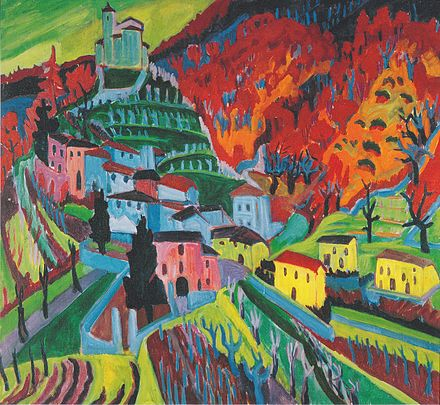

In [ ]:
display(Image(style_reference_image))

In [ ]:
def load_image(image_pth):
    max_dims = 512 # limiting pixel dimensions to 512 pixels because of how model will be constructed in the 5th conv layer.
    image = tf.io.read_file(image_pth) # read in file
    image = tf.image.decode_image(image, channels=3) # determines image format and converts to tensor dtype
    image = tf.image.convert_image_dtype(image, tf.float32) #change image type back to float32bit
    
    img_shape = tf.cast(tf.shape(image)[:-1], tf.float32) # casting shape of image to float
    long_dim = max(img_shape)
    img_scale = max_dims/long_dim
    
    new_img_shape = tf.cast(img_shape * img_scale, tf.int32)
    
    image = tf.image.resize(image, new_img_shape)
    image = image[tf.newaxis, :]
    return image

In [ ]:
def show_images(img, title=None):
    if len(img.shape) > 3: # image dimensions
        img = tf.squeeze(img, axis=0)
        
    plt.imshow(img)
    if title:
        plt.title(title)

Now we can load and show our images as a plot of resized pixels between 0-500 pixels using matplotlib:

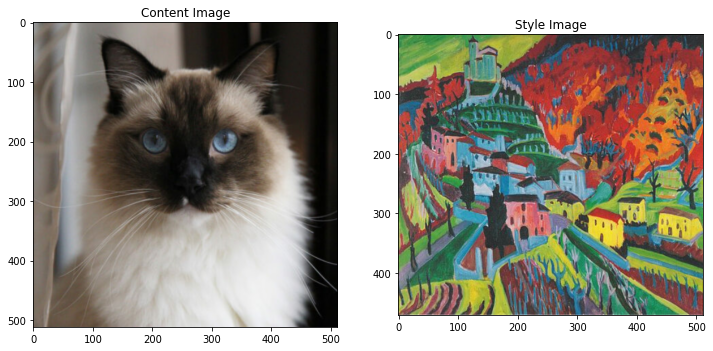

In [ ]:
content_image = load_image(input_image)
style_image = load_image(style_reference_image)

mpl.rcParams['figure.figsize'] = (12, 12)

plt.subplot(1, 2, 1)
show_images(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_images(style_image, 'Style Image')

Now that we know the images we will be working with, let's move onto our VGG19 architecture.

### Using the VGG19 architecture

A VGG19 network is a very deep convolutional network architecture model. It was first proposed by Simonyan, K & Zisserman, A. (2014) in *Very Deep Convolutional Networks for Large-Scale Image Recognition* (https://arxiv.org/abs/1508.06576)

This model is a CNN made up of 5 different convolutional layers. The first few layer activations are used to represent simple features in an image such as detecting edges and different image textures whereas deeper layer looks for more constructive images like circles or oval shapes that may make out eyes ore even doorknobs.

In our case, rather than building up a Deep model ourselves, we will opt to use a VGG19 image classification network from keras.

Also, because we will be working with tensors, we will need to be able to transform our tensors to a final image comprised of our content image and style reference image. We will not create a function to help us do that.

In [ ]:
def tensor_to_image(tensor):
    ''' Converts input tensor to image format. Changes pixels from [0, 1] to [0, 255]
    Also changes the pixels from float to int type'''
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3 and tensor.shape[0] == 1: #3 Channels
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In [ ]:
#loading VGG19
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224)) #default input size
vgg19 = tf.keras.applications.VGG19(include_top=True, weights='imagenet') #pretrained on imagenet
pred_probs = vgg19(x)
print(pred_probs.shape)
vgg19.summary()

(1, 1000)
Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)   

Because the vgg19 is a pretrained model on photos in the imagenet test set, we will now test to see how well it predicts our content image based off of a probability function we created surrounding the VGG19 model:

In [ ]:
top_5_preds = tf.keras.applications.vgg19.decode_predictions(pred_probs.numpy())[0]
for number, class_name, prob in top_5_preds:
    print(class_name, ':', prob)

Siamese_cat : 0.9833175
lynx : 0.015380888
Egyptian_cat : 0.00033405647
tabby : 0.00016339471
Persian_cat : 0.0001290194


Now, let's reload the VGG model without top 3 model layers indicated by **include_top=False** and we will now also look at the list of layers in the model too:

In [ ]:
vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

for layer in vgg19.layers:
  print(layer.name)

input_32
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Now we will chose the intermediate layers in this network to represent the styling and content of the image we will represent in our model:

In [ ]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv2',
                'block2_conv2',
                'block3_conv2', 
                'block4_conv2', 
                'block5_conv2']

content_layers_length = len(content_layers)
style_layers_length = len(style_layers)

In the paper on neural style transfer, the authors present a figure which show the effect that each layer has on the overall image for both style reconstuctions and content reconstructions. In a CNN, after each layer and subsequent convolution when using a filter,the dimension of the image shrinks from the original 3D channel. One example of this could be for RBG channels inside the model. Knowing background knowledge of CNNs, we note that the style reconsturctions are important in all layer and the most optimal content reconstructions are in the deeper layers, thus resulting in the above results.

### Building The Model 

We will now use the keras API inside of tensorflow to help assist in building this model:

In [ ]:
def vgg19_layers(layers):
    ''' Creates vgg19 model that returns list of output values for model.'''
    vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet') # Don't include top3 model layers
    vgg19.trainable = False #Because we are using a form of transfer learning, it will be best to set this to false 
    
    outputs = [vgg19.get_layer(name).output for name in layers]
    
    model = tf.keras.Model([vgg19.input], outputs)
    return model
    

Now to extract the layers and take a look at them:

In [ ]:
style_extraction = vgg19_layers(style_layers)
style_outputs = style_extraction(style_image*255)

for layer, info in zip(style_layers, style_outputs):
    print(layer)
    print(" Shape of layer: ", info.numpy().shape)
    print(" Min: ", info.numpy().min())
    print(" Max: ", info.numpy().max())
    print(" Mean: ", info.numpy().mean())
    print("")

block1_conv2
 Shape of layer:  (1, 471, 511, 64)
 Min:  0.0
 Max:  2715.3274
 Mean:  155.96686

block2_conv2
 Shape of layer:  (1, 235, 255, 128)
 Min:  0.0
 Max:  6028.299
 Mean:  169.331

block3_conv2
 Shape of layer:  (1, 117, 127, 256)
 Min:  0.0
 Max:  7096.075
 Mean:  213.82112

block4_conv2
 Shape of layer:  (1, 58, 63, 512)
 Min:  0.0
 Max:  14595.975
 Mean:  414.94156

block5_conv2
 Shape of layer:  (1, 29, 31, 512)
 Min:  0.0
 Max:  1089.3787
 Mean:  15.873573



### Content and Style Extraction

In the paper, it is mentioned that a Gram Matrix is used to deal with the feature correlations in each layer. The Gram matrix looks something like this:

![Gram%20Matrix%20Equation.PNG](https://drive.google.com/uc?export=view&id=1UXb2nxuO8VfHSXY0kx1rHqbXhHVq8pZP)

In short, a Gram matrix is a result from multiplying a matrix with the transpose of itself (indicated by * for transpose).

But, we also want to average across this equation, so will include that in our function and utilize the [einsum function](https://www.tensorflow.org/api_docs/python/tf/einsum) inside of the linalg library in tensorflow:

In [ ]:
def gram_matrix(tensor_):
    Eins_sum = tf.linalg.einsum('bijk, bijt->bkt', tensor_, tensor_) #b indicates batch mat mul,t indicates transposed k 
    input_shape = tf.shape(tensor_)
    feat_vec_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return Eins_sum/(feat_vec_locations)

Now let us create an object that can extract both the style and content tensors of our images:

In [ ]:
class StyleContentExtractionModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentExtractionModel, self).__init__() 
        self.vgg19 = vgg19_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_of_style_layers = len(style_layers)
        self.vgg19.trainable = False
    
    def call(self, inputs):
        """returns the feature map of required layer"""
        inputs = inputs*255.0
        preprocesssed_input = tf.keras.applications.vgg19.preprocess_input(inputs) #preprocesses tensor between 0->255
        outputs = self.vgg19(preprocesssed_input)
        style_outputs, content_outputs = (outputs[:self.num_of_style_layers],
                                         outputs[self.num_of_style_layers:])
        
        # style output processing
        style_outputs = [gram_matrix(style_output)
                        for style_output in style_outputs]
        
        #creating dictionary to store for both style and content
        style_dict = {style_name:value
                     for style_name, value
                     in zip(self.style_layers, style_outputs)}
        content_dict = {content_name:value
                       for content_name, value 
                       in zip(self.content_layers, content_outputs)}
        
        return {'content':content_dict, 'style':style_dict}
    

In [ ]:
Extractor = StyleContentExtractionModel(style_layers, content_layers)

results = Extractor(tf.constant(content_image)) #creates constant tensor among all layers

style_results = results['style']

print('Styles: ')
for name, output in sorted(results['style'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())
    print()
    
print("Contents:")
for name, output in sorted(results['content'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())

Styles: 
   block1_conv2
    shape:  (1, 64, 64)
    min:  19.677374
    max:  201291.48
    mean:  4531.9717

   block2_conv2
    shape:  (1, 128, 128)
    min:  0.075820796
    max:  136210.17
    mean:  3801.6917

   block3_conv2
    shape:  (1, 256, 256)
    min:  17.946066
    max:  179115.39
    mean:  8600.991

   block4_conv2
    shape:  (1, 512, 512)
    min:  0.0
    max:  1107173.8
    mean:  35928.18

   block5_conv2
    shape:  (1, 512, 512)
    min:  0.0
    max:  8907.7295
    mean:  117.7593

Contents:
   block5_conv2
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  806.47815
    mean:  9.75509


### Gradient Descent

Now we will implement Gradient Descent for our model. If you are unfamiliar with Gradient Descent, you can read more about it here: https://builtin.com/data-science/gradient-descent

If you do not wish to read the full article, in short Gradient Descent is an optimization algorithm with a key goal of minimizing the function f(x) for a given objective function. In our case, this is known as a cost/loss function J(w). The best way to visualize Gradient Descent is using the following image shown below:

![Gradient%20Descent.png](https://drive.google.com/uc?export=view&id=1Nc6_KZ-5kyBVHjwtLBoZR7hgeyO-VnG3)

In data science models we want to minimize the error of our model. So in this scenario, W would be the minimum error the model would obtain and the total error is indicated by the function J(w). In our case, we will do this by calculating the mean square error for the image's output and then take the weighted sum of these losses.

We will start by setting our target values:

In [ ]:
content_targets = Extractor(content_image)['content']
style_targets = Extractor(style_image)['style']

Now, we will use [tf.Variable](https://www.tensorflow.org/api_docs/python/tf/Variable) from tensorflow to represent a tensor. In this case, an instance of our **input image**. This will have the same data type as the initialization value we started with. 

In [ ]:
image = tf.Variable(content_image)

We will now be able to modify the value of this tensor using this variable instance instead. 


Now, let us move on to define our loss function. We'll make use of the add_n function in TensorFlow to add all of our element-wise input tensors together and determine the total loss for both the style and input image:

In [ ]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / style_layers_length

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / content_layers_length
    loss = style_loss + content_loss
    return loss

In one approach of the neural style transfer algorithm by the authors of the paper, the below weights were optimal settings they used for optimization weights:

In [ ]:
#style_weight = [1e3/n**2 for n in [64,128,256,512,512]]
#content_weight = [1e0]

But instead, we will use the following:

In [ ]:
style_weight=3e-1 
content_weight=1e5 

Now lets create an optimizer using the common ***Adam*** optimizer, choose a learning rate of 0.02, beta of 0.99 and epsilon of 1e-1:

In [ ]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

Because the image is a floating point array. We will keep the pixel values between 0 and 1:

In [ ]:
def between_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Now, we will define a tf function using [tf.GradientTape](tensorflow.org/api_docs/python/tf/GradientTape) which will help us track different stages upon updating the image (differentiation among our image updating operations):

In [ ]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = Extractor(image)
        loss = style_content_loss(outputs)
    
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(between_0_1(image))

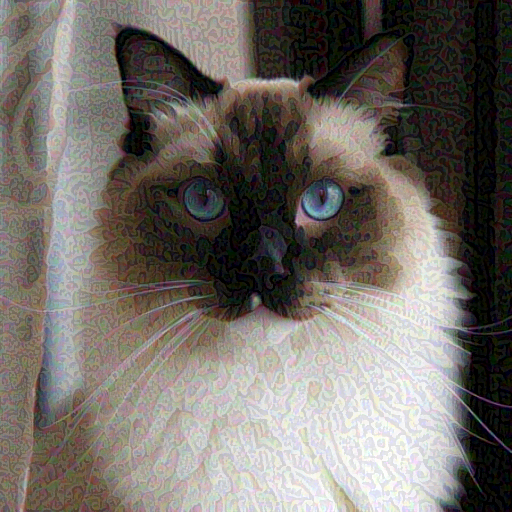

In [ ]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

Now we will train on more interation to view our results:

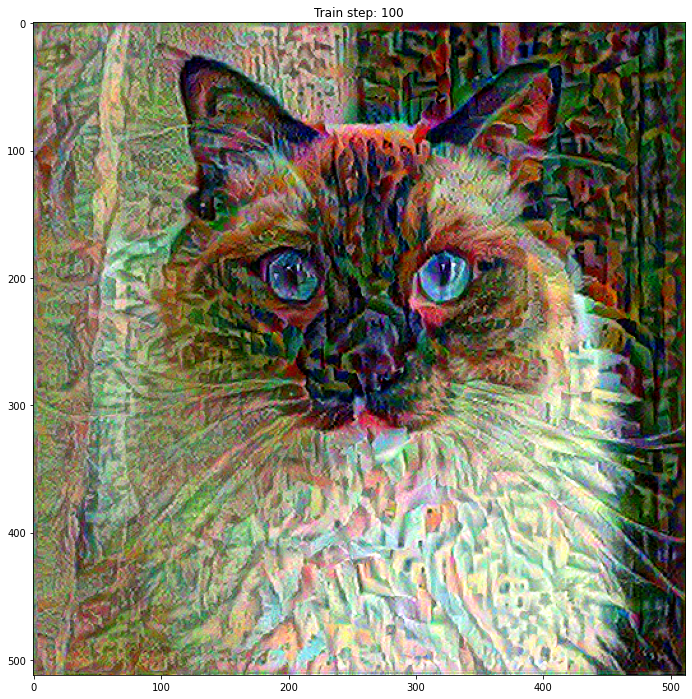

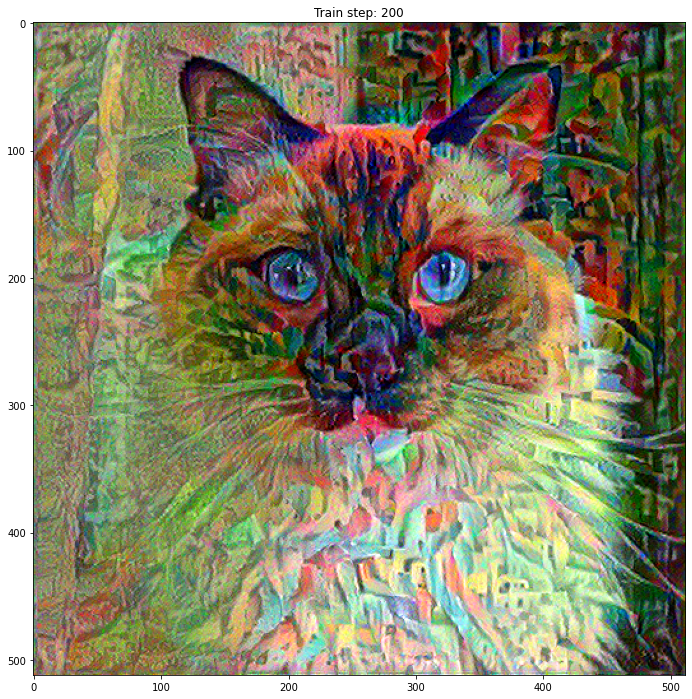

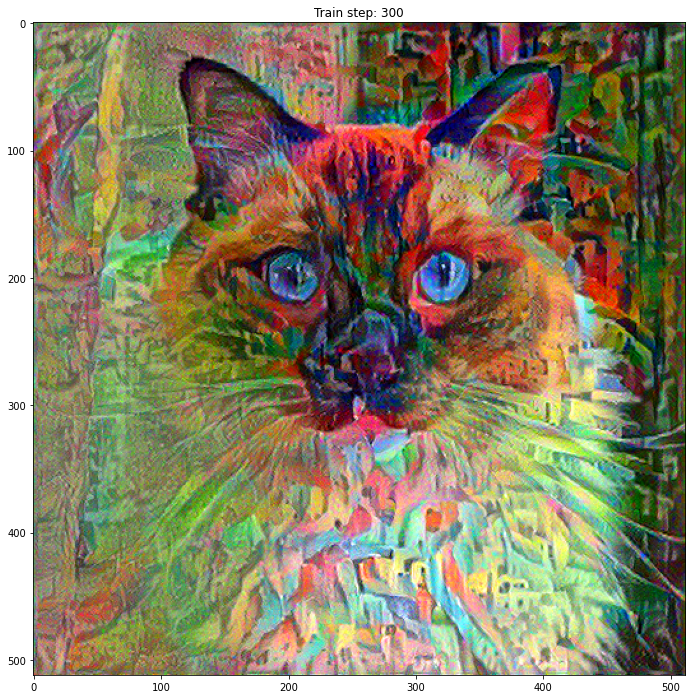

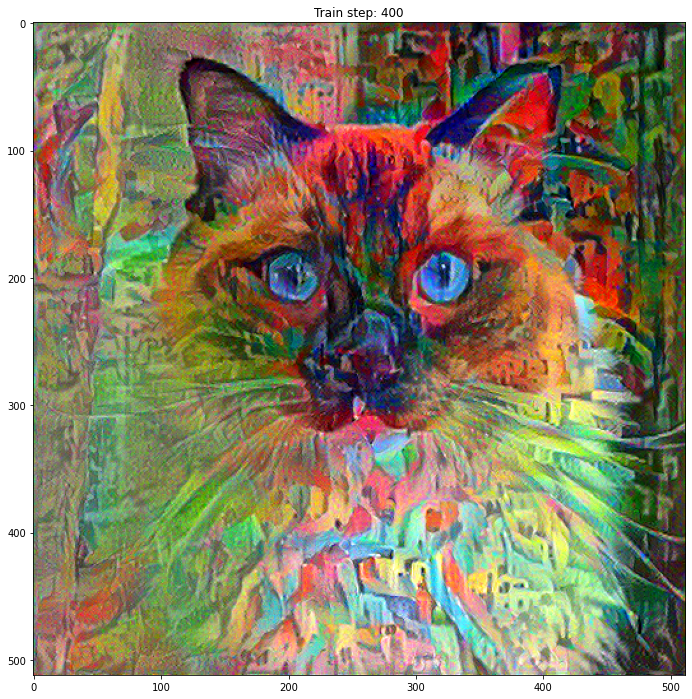

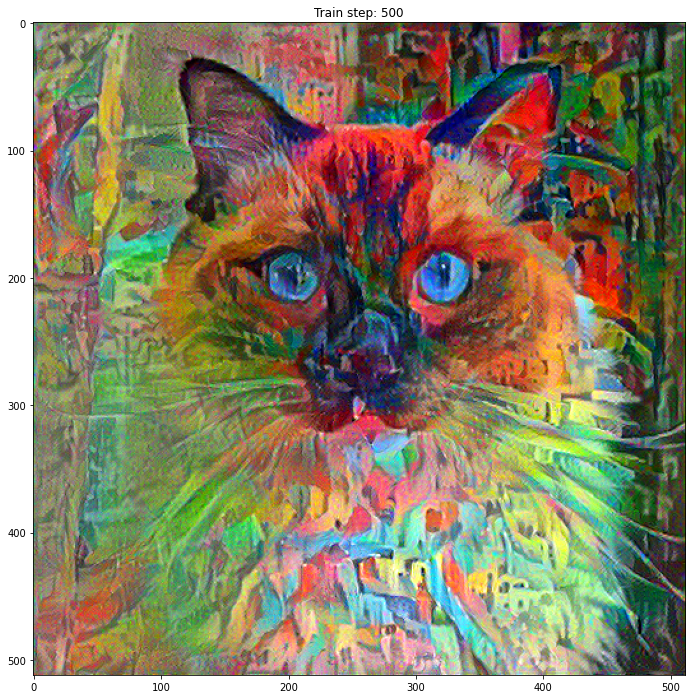

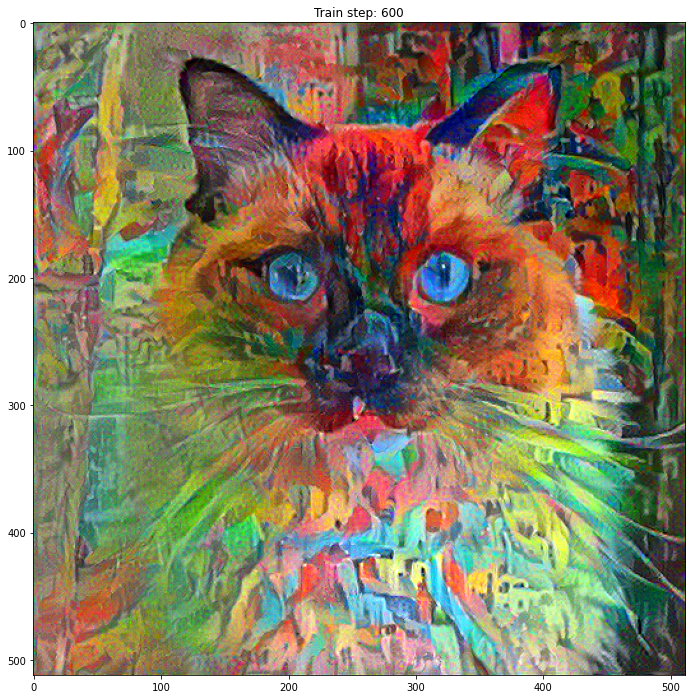

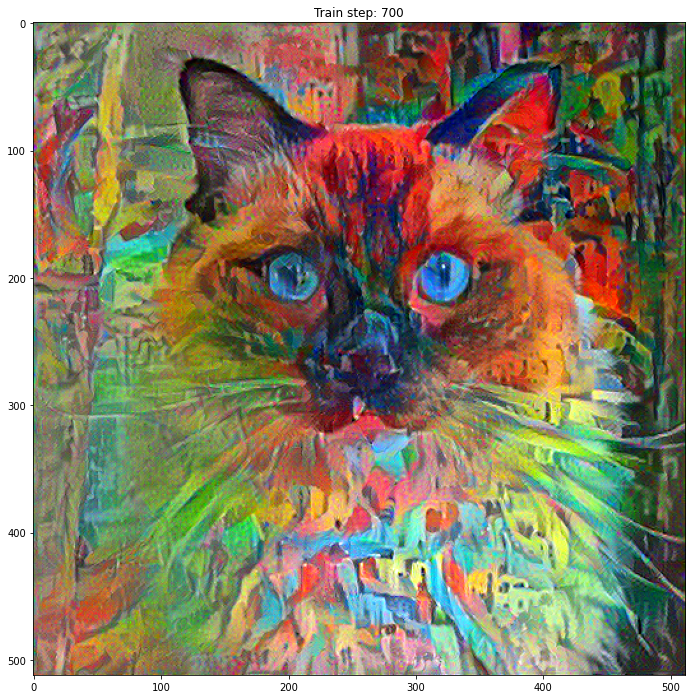

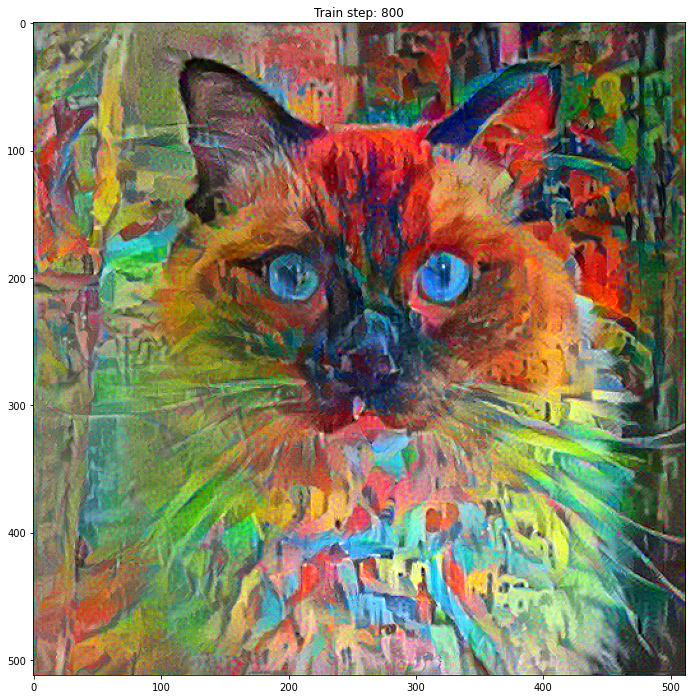

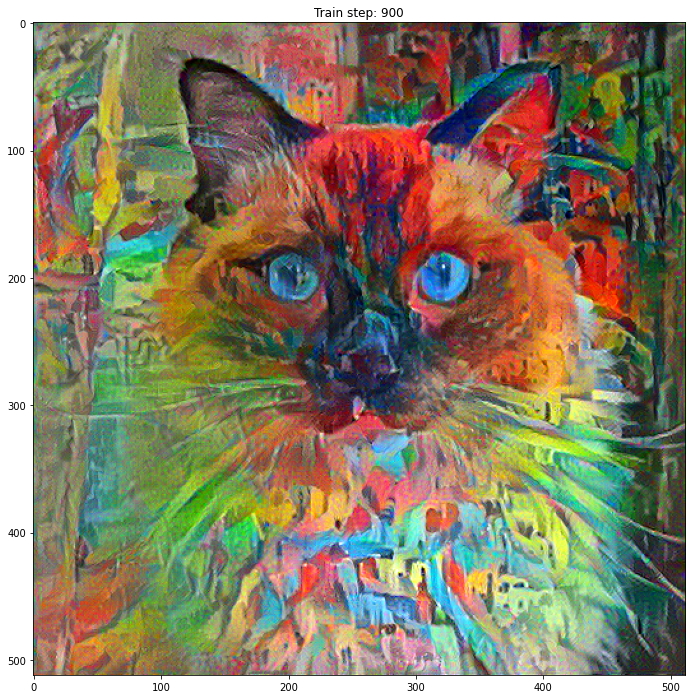

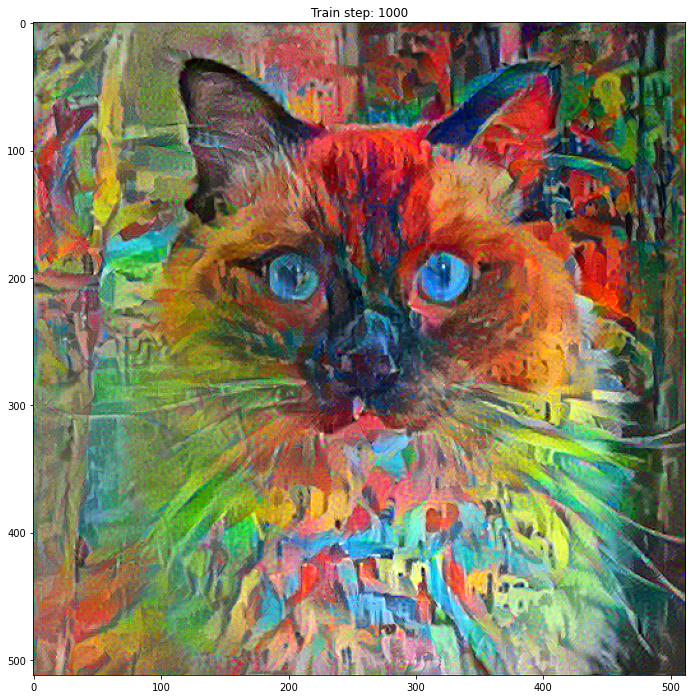

Total time: 331.5


In [ ]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
    show_images(image.read_value())
    plt.title("Train step: {}".format(step))
    plt.show()
    

end = time.time()
print("Total time: {:.1f}".format(end-start))

Now based on our above results, our trained set of images actually look quite good! but the problem is that with this, there is a lot of variation in what is produced. In order to do this, we will use a regularization term known as total variation loss.

### Total Variation Loss Function

In image processing, you may run into images where there is a lot of "noise" or unwanted film grain like the following image: ![Image%20Processing%20%28Before%29.PNG](https://drive.google.com/uc?export=view&id=1jwAuOu0InXPlb592tZO_Xr_gu3FGflyB)


The goal of using total variation loss would be to get rid of this noise and do the following:


 ![Image%20Processing%20%28After%29.PNG](https://drive.google.com/uc?export=view&id=1UH0_NHXEpVydpL3XFDWpsikyA9jVYAw9)

As per [wikipedia](https://en.wikipedia.org/wiki/Total_variation_denoising), The total variation function for a 1D image looks something  like this:


![1D%20total%20variation%20loss.PNG](https://drive.google.com/uc?export=view&id=1unXD0he4La7oRUnJzq7hI5G9_RqW3wE-)

This represents the total variation in a image and the variable y is the *digital signal* or amplitude signal. In a 2D image, the equation becomes: 


![3D%20total%20variation%20loss.PNG](https://drive.google.com/uc?export=view&id=12OGyhrHPAdrWKZC3MCCDGO3dXlH63ZoB)

So in python, we would want to map out the x, y variations and then view our deltas as well in the content image. The functions that would help us achieve this would look something like this: 

In [ ]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

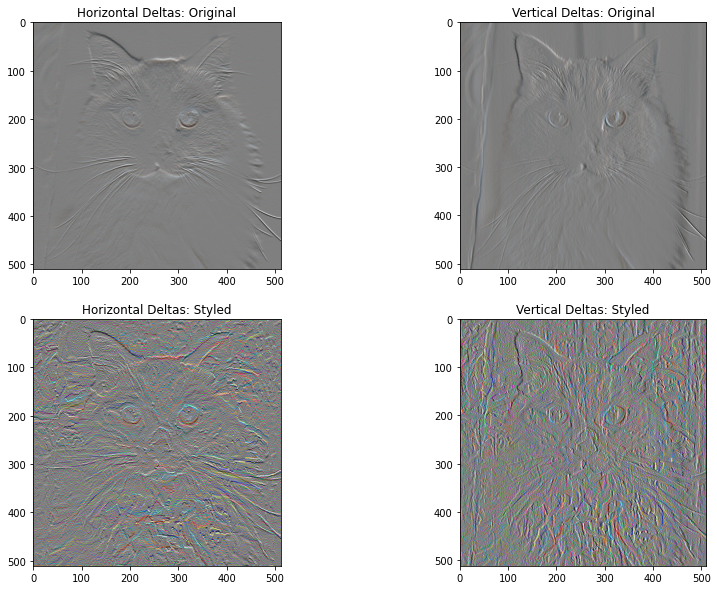

In [ ]:
x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
show_images(between_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
show_images(between_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3)
show_images(between_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2, 2, 4)
show_images(between_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

The above is basically an edge detector for the content image.  So, in the **horizontal delta image** above you will note more horizontal lines and edges being captured and the opposite with the **vertical deltas image**. But, what you will note is that as we blended the two images together the high frequency components have increased as well, therefore there is a lot more variation going on in the image. 

More commonly, This is commonly referred to as the [Sobel Edge Detection](https://www.sciencedirect.com/topics/engineering/sobel-edge-detection) where when we convolve thorugh an image with convolution, we we want to be able to determine both verticle and horizontal edges relative to the pixel grid we are working with. Sobel edge detection looks like the following for our content image:

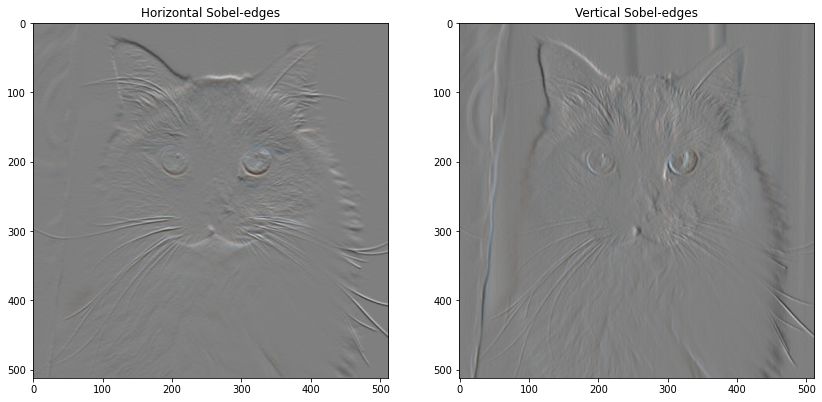

In [ ]:
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1)
show_images(between_0_1(sobel[..., 0]/4+0.5), "Horizontal Sobel-edges")
plt.subplot(1, 2, 2)
show_images(between_0_1(sobel[..., 1]/4+0.5), "Vertical Sobel-edges")

The actual total variation loss function in python looks like the following:

In [ ]:
def total_variation_loss(image):
    yi_deltas, yj_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas)) 

We could then view the output of our total variation loss in our image:

In [ ]:
total_variation_loss(image).numpy()

120463.1

While working on this project, I found that tensorflow has a built in function that can actually do the total_variation_loss for us in one line of code:

In [ ]:
tf.image.total_variation(image).numpy()

array([120463.1], dtype=float32)

### Final Optimization Step

Now that we have our total variation loss, we can associate a weight to our total variation and optimize our loss function so that it takes the weight of the variation into consideration and view the results of our final image once more:

In [ ]:
total_variation_weight=25

Let us copy our above @tf function and now add the total variation weight parameter to the function:

In [ ]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = Extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight*tf.image.total_variation(image)
    
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(between_0_1(image))

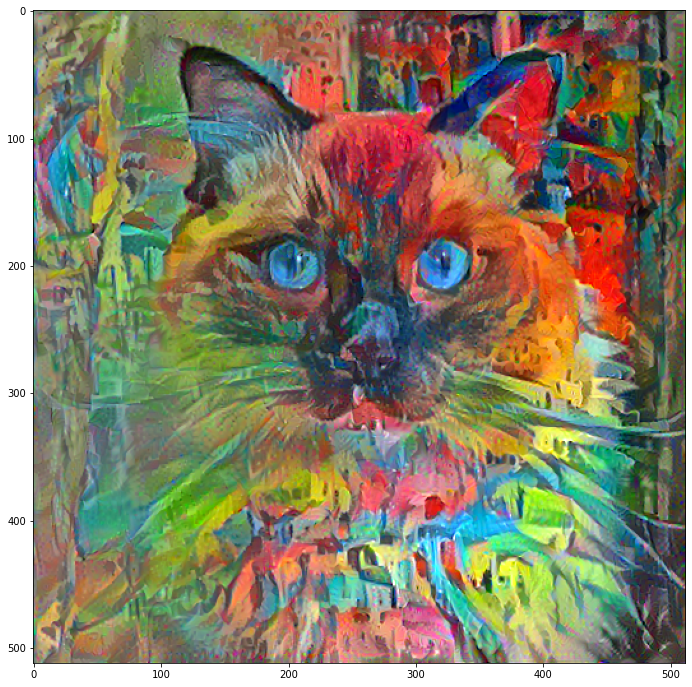

Total time: 329.2


In [ ]:
# Reinitilize our optimization variable
image = tf.Variable(content_image)

# Re-run our optimization procedure with only one output image this time

import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
    # show_images(image.read_value())
    # plt.title("Train step: {}".format(step))
    # plt.show()
show_images(image.read_value())  
plt.show()

end = time.time()
print("Total time: {:.1f}".format(end-start))


And there you have it! We have our final output image for our successful model.

Let us now save the image for safe keeping in our local repo:

In [ ]:
file_name = 'stylized-image.png'
tensor_to_image(image).save(file_name)

try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download(file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Bonus Section

In this section, we will look at an image of the actual VGG19 architecture so it is a bit more clear as a CNN. We can also look at the individual filters in each convolutional layers and analyze the feature mappings in one of the layers and how the weights in the layers are represented. We will end finally by visualizing the feature mappings. So, without further ado let us do that now: 

![VGG19%20Architecture.PNG](https://drive.google.com/uc?export=view&id=1DjtM06y-JS3vxYm8i46b73o61E-Ii2TZ)

The above image is the structure of the VGG19 model where 19 refers to the number of layers in the network. VGG19 was trained on ImageNet, which contains ~1.2million images allowing the model to differentiate different data representations. 

We can now go a level further and continue to analyze the filters and visualize what the Conv filters look like: 

In [ ]:
# showcase filter shapes (3x3 filters)
for layer in vgg19.layers:
    # if statements to check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # filter weights in model
    filters, biases = layer.get_weights()
    print(layer.name, filters.shape)

block1_conv1 (3, 3, 3, 64)
block1_conv2 (3, 3, 64, 64)
block2_conv1 (3, 3, 64, 128)
block2_conv2 (3, 3, 128, 128)
block3_conv1 (3, 3, 128, 256)
block3_conv2 (3, 3, 256, 256)
block3_conv3 (3, 3, 256, 256)
block3_conv4 (3, 3, 256, 256)
block4_conv1 (3, 3, 256, 512)
block4_conv2 (3, 3, 512, 512)
block4_conv3 (3, 3, 512, 512)
block4_conv4 (3, 3, 512, 512)
block5_conv1 (3, 3, 512, 512)
block5_conv2 (3, 3, 512, 512)
block5_conv3 (3, 3, 512, 512)
block5_conv4 (3, 3, 512, 512)


To take this a step futher, we can now visualize the filter channels using matplotlib. We will need to get the layer weights again, normazlie the filter values between 0-1 and then assign our subplots to show the channels. We will randomly pick a layer that isn't too larger to do this, otherwise we will end up with several hundred visualizations:

(3, 3, 3, 64)


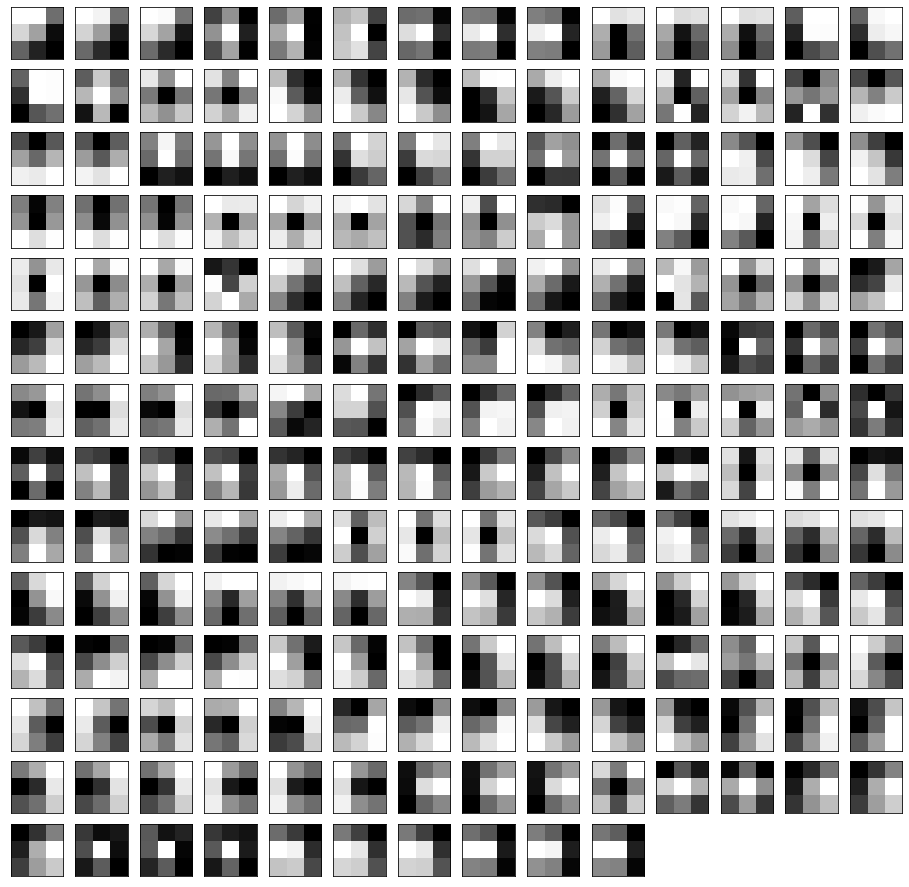

In [ ]:
plt.figure(figsize=(16,16))

# weights from the 3th hidden layer
filters, biases = vgg19.layers[1].get_weights()
print(filters.shape)

# normalize filter values to 0-1, for visualization needs
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

# plot all filters in layer
n_filters, ix = 64, 1

for i in range(n_filters):
    # get the filter
    f = filters[:, :, :, i]
    # plot each channel separately
    for j in range(3):
        # specify subplot and turn of axis
        ax = plt.subplot(14, 14, ix) # (64*3 maps in total, mapped in a 14x14 image matrix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
        
# show the figure
plt.show()

In the same way, we could look at a higher hidden layer and only look at a few of the filters:

(3, 3, 128, 128)


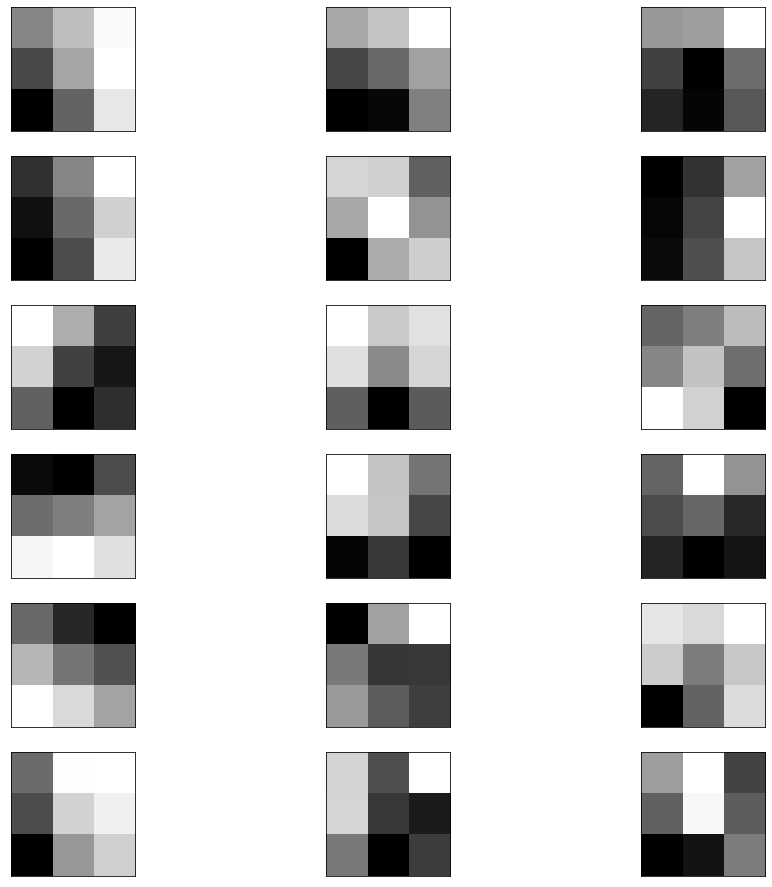

In [ ]:
plt.figure(figsize=(16,16))

# weights from the 3th hidden layer
filters, biases = vgg19.layers[5].get_weights()
print(filters.shape)

# normalize filter values to 0-1, for visualization needs
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

# plot first few filters
n_filters, ix = 6, 1

for i in range(n_filters):
    # get the filter
    f = filters[:, :, :, i]
    # plot each channel separately
    for j in range(3):
        # specify subplot and turn of axis
        ax = plt.subplot(n_filters, 3, ix) 
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
        
# show the figure
plt.show()

Finally, we could visualize how the feature maps look on the content image in the first convolutional layer. You will be able to note different highlighted lines and specific focus on background details and foreground details in our 64 maps we display:|

In [ ]:
#loading VGG19
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224)) #default input size
vgg19 = tf.keras.applications.VGG19(include_top=True, weights='imagenet') #pretrained on imagenet

Model: "model_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
Total params: 1,792
Trainable params: 1,792
Non-trainable params: 0
_________________________________________________________________


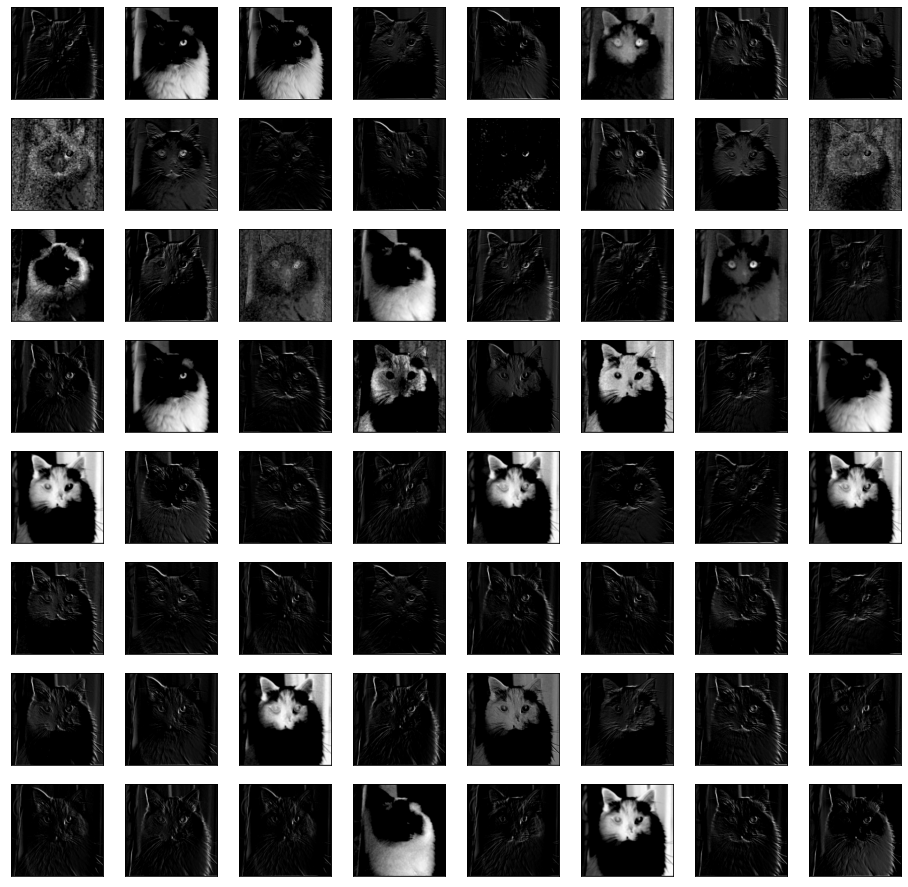

In [ ]:
plt.figure(figsize=(16,16))

# redefine model to output right after the first hidden layer
model = tf.keras.Model(inputs=[vgg19.input], outputs=vgg19.layers[1].output)
model.summary()

# preprocess input
content_image = tf.keras.applications.vgg19.preprocess_input(content_image*255)
content_image = tf.image.resize(content_image, (224, 224))

# get feature map for first hidden layer
feature_maps = model.predict(content_image)

# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
        
# show the figure
plt.show()

## End of Notebook

We've reached the end of the notebook! Thank you so much for viewing and making it to the end. Have a great day!